In [4]:
# First let's import the packages we will use in this project
import pandas as pd
import numpy as np
import seaborn as sns

import matplotlib.pyplot as plt
import matplotlib.mlab as mlab
import matplotlib
plt.style.use('ggplot')
from matplotlib.pyplot import figure
#magic Function 
%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (12,8)

pd.options.mode.chained_assignment = None



# read in the data
data=pd.read_csv(r'E:\Data_Analysis\movi\movies.csv')


In [5]:
#see data to understand it
data.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000.0,46998772.0,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000.0,58853106.0,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000.0,538375067.0,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000.0,83453539.0,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000.0,39846344.0,Orion Pictures,98.0


In [6]:
#how to clean data 
#how ti get mean of each null value in each column
for col in data.columns:
    pct_missing=np.mean(data[col].isnull())
    print("{}--{}%".format(col,pct_missing))

name--0.0%
rating--0.010041731872717789%
genre--0.0%
year--0.0%
released--0.0002608242044861763%
score--0.0003912363067292645%
votes--0.0003912363067292645%
director--0.0%
writer--0.0003912363067292645%
star--0.00013041210224308815%
country--0.0003912363067292645%
budget--0.2831246739697444%
gross--0.02464788732394366%
company--0.002217005738132499%
runtime--0.0005216484089723526%


In [93]:
#number of nulls in each column
for col in data.columns:
    pct_mis=data[col].isnull().sum()
    print("{}--{}".format(col,pct_mis))

name--0
rating--77
genre--0
year--0
released--0
score--3
votes--3
director--0
writer--3
star--1
country--3
budget--0
gross--189
company--17
runtime--4
new--2


In [7]:
#Data Types For columns
data.dtypes

name         object
rating       object
genre        object
year          int64
released     object
score       float64
votes       float64
director     object
writer       object
star         object
country      object
budget      float64
gross       float64
company      object
runtime     float64
dtype: object

In [61]:
#Fill NaN values and change dataType Of Budget Column
data['budget'].fillna(0,inplace=True)
data['gross'].fillna(0,inplace=True)
data['budget']=data['budget'].astype('int64')
data['gross']=data['gross'].astype('int64')


0                                 NaN
1        July 2, 1980 (United States)
2       June 20, 1980 (United States)
3                                 NaN
4                                 NaN
                    ...              
7663                              NaN
7664                              NaN
7665                              NaN
7666                              NaN
7667                              NaN
Name: new, Length: 7668, dtype: object

In [9]:
#fill tow null value with 2022 
data['released'].fillna(2022,inplace=True)

In [12]:

indexOfComma=data['released'].str.find(',')

0        7.0
1        6.0
2        7.0
3        6.0
4        7.0
        ... 
7663    10.0
7664    10.0
7665     8.0
7666     9.0
7667     9.0
Name: released, Length: 7668, dtype: float64

In [27]:
#create new column with correct year
data_after_expan=data['released'].str.split(' ',expand=True)
data_after_expan.columns=["x","y","a","b","c","d","o"]
data['year-correct']=data_after_expan["a"]


In [148]:
data.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,year-correct
5445,533,5,0,2009,697,7.8,1100000.0,1155,1778,2334,55,237000000,2847246203,2253,162.0,31
7445,535,5,0,2019,184,8.4,903000.0,162,743,2241,55,356000000,2797501328,1606,181.0,41
3045,6896,5,6,1997,705,7.8,1100000.0,1155,1778,1595,55,200000000,2201647264,2253,194.0,19
6663,5144,5,0,2015,699,7.8,876000.0,1125,2550,524,55,245000000,2069521700,1540,138.0,37
7244,536,5,0,2018,193,8.4,897000.0,162,743,2241,55,321000000,2048359754,1606,149.0,40


In [64]:
#sort data depending on column gross and descending not ascending
data=data.sort_values(by=['gross'], inplace=False , ascending=False)

In [43]:
#sorting data depend on year column
data.sort_values(by=['year'],ascending=False , inplace=False)

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,year-correct
7667,Tee em el,NaN,Horror,2020,"August 19, 2020 (United States)",5.7,7.0,Pereko Mosia,Pereko Mosia,Siyabonga Mabaso,South Africa,0,NaN,PK 65 Films,102.0,2020
7655,Legend of Deification,TV-PG,Animation,2020,"October 1, 2020 (United States)",6.6,1300.0,Teng Cheng,NaN,Guangtao Jiang,China,0,2.406631e+08,Beijing Enlight Pictures,110.0,2020
7643,Tenet,PG-13,Action,2020,"September 3, 2020 (United States)",7.4,387000.0,Christopher Nolan,Christopher Nolan,John David Washington,United States,205000000,3.636566e+08,Warner Bros.,150.0,2020
7645,Birds of Prey,R,Action,2020,"February 7, 2020 (United States)",6.1,190000.0,Cathy Yan,Christina Hodson,Margot Robbie,United States,84500000,2.018585e+08,Clubhouse Pictures (II),109.0,2020
7646,The Invisible Man,R,Drama,2020,"February 28, 2020 (United States)",7.1,186000.0,Leigh Whannell,Leigh Whannell,Elisabeth Moss,Canada,7000000,1.431510e+08,Universal Pictures,124.0,2020
7647,Onward,PG,Animation,2020,"March 6, 2020 (United States)",7.4,120000.0,Dan Scanlon,Dan Scanlon,Tom Holland,United States,0,1.419506e+08,Walt Disney Pictures,102.0,2020
7648,Bad Boys for Life,R,Action,2020,"January 17, 2020 (United States)",6.6,140000.0,Adil El Arbi,Peter Craig,Will Smith,United States,90000000,4.265052e+08,Columbia Pictures,124.0,2020
7649,Sonic the Hedgehog,PG,Action,2020,"February 14, 2020 (United States)",6.5,102000.0,Jeff Fowler,Pat Casey,Ben Schwartz,United States,85000000,3.197157e+08,Paramount Pictures,99.0,2020
7650,Dolittle,PG,Adventure,2020,"January 17, 2020 (United States)",5.6,53000.0,Stephen Gaghan,Stephen Gaghan,Robert Downey Jr.,United States,175000000,2.454878e+08,Universal Pictures,101.0,2020
7651,The Call of the Wild,PG,Adventure,2020,"February 21, 2020 (United States)",6.8,42000.0,Chris Sanders,Michael Green,Harrison Ford,Canada,135000000,1.111055e+08,20th Century Studios,100.0,2020


In [113]:
# to show All Data 
pd.set_option("display.max_rows",None)

In [53]:
#to show some of data not All
pd.set_option("display.max_rows",20)

In [54]:
#drop duplicate values from specific column and show each value must be=1  that mean no duplicate value
data['company'].drop_duplicates().sort_values(ascending=False).value_counts()

Boneyard Film Company Inc.     1
Screen NSW                     1
Matten Productions             1
Easy Company                   1
First Millenium Partnership    1
                              ..
Bonded Filmworks               1
Block 2 Pictures               1
Marvel Entertainment           1
2003 Productions               1
Quad Productions               1
Name: company, Length: 2385, dtype: int64

In [50]:
#drop Duplicate values from all columns
data.drop_duplicates()


,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,year-correct
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,4.699877e+07,Warner Bros.,146.0,1980
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,5.885311e+07,Columbia Pictures,104.0,1980
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,5.383751e+08,Lucasfilm,124.0,1980
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,8.345354e+07,Paramount Pictures,88.0,1980
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,3.984634e+07,Orion Pictures,98.0,1980
5,Friday the 13th,R,Horror,1980,"May 9, 1980 (United States)",6.4,123000.0,Sean S. Cunningham,Victor Miller,Betsy Palmer,United States,550000,3.975460e+07,Paramount Pictures,95.0,1980
6,The Blues Brothers,R,Action,1980,"June 20, 1980 (United States)",7.9,188000.0,John Landis,Dan Aykroyd,John Belushi,United States,27000000,1.152299e+08,Universal Pictures,133.0,1980
7,Raging Bull,R,Biography,1980,"December 19, 1980 (United States)",8.2,330000.0,Martin Scorsese,Jake LaMotta,Robert De Niro,United States,18000000,2.340243e+07,Chartoff-Winkler Productions,129.0,1980
8,Superman II,PG,Action,1980,"June 19, 1981 (United States)",6.8,101000.0,Richard Lester,Jerry Siegel,Gene Hackman,United States,54000000,1.081857e+08,Dovemead Films,127.0,1981
9,The Long Riders,R,Biography,1980,"May 16, 1980 (United States)",7.0,10000.0,Walter Hill,Bill Bryden,David Carradine,United States,10000000,1.579519e+07,United Artists,100.0,1980


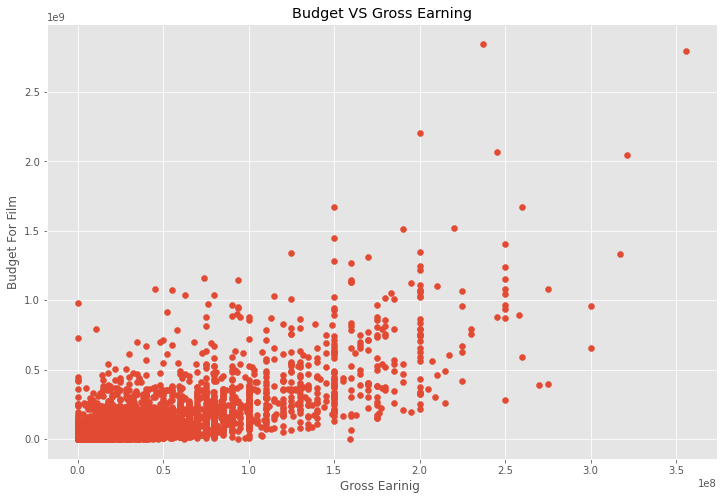

In [70]:
#make Scatter plot between Budget And Gross to show there is relationship or not?

plt.scatter(data['budget'],data['gross'])
plt.title("Budget VS Gross Earning")
plt.xlabel("Gross Earinig")
plt.ylabel("Budget For Film")
plt.show()

In [ ]:
#There Is Hight Correlation Between Budget and Gross
#this my guess

<AxesSubplot:xlabel='budget', ylabel='gross'>

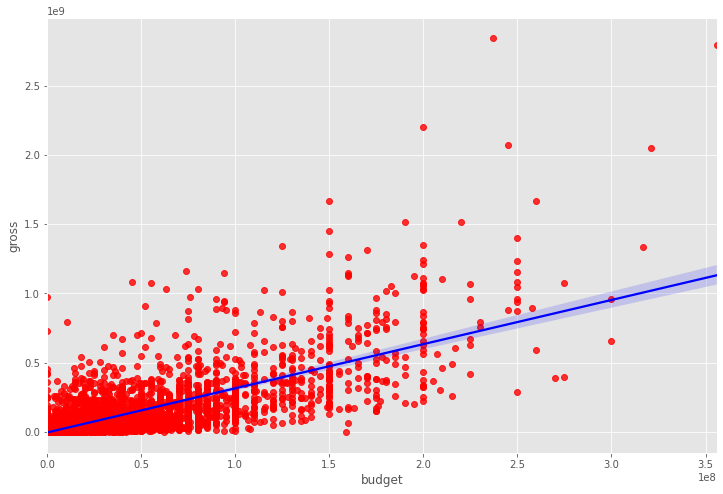

In [72]:
sns.regplot(x='budget',y='gross',data=data,scatter_kws={"color":"red"} , line_kws={"color":"blue"})

In [83]:
# compute Correlation to show relation btween objects
correlation=data.corr(method='pearson')
correlation

,year,score,votes,budget,gross,runtime
year,1.000000,0.097995,0.222945,0.309212,0.261900,0.120811
score,0.097995,1.000000,0.409182,0.055665,0.186392,0.399451
votes,0.222945,0.409182,1.000000,0.486862,0.632834,0.309212
budget,0.309212,0.055665,0.486862,1.000000,0.750157,0.269510
gross,0.261900,0.186392,0.632834,0.750157,1.000000,0.245235
runtime,0.120811,0.399451,0.309212,0.269510,0.245235,1.000000


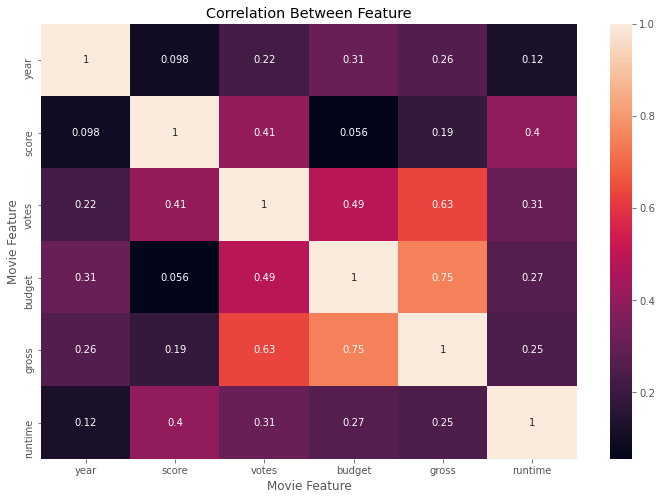

In [89]:
sns.heatmap(correlation,annot=True)
plt.title("Correlation Between Feature")
plt.xlabel("Movie Feature")
plt.ylabel("Movie Feature")
plt.show()

In [84]:
#my guess is right there is strong relationship between gross and budget

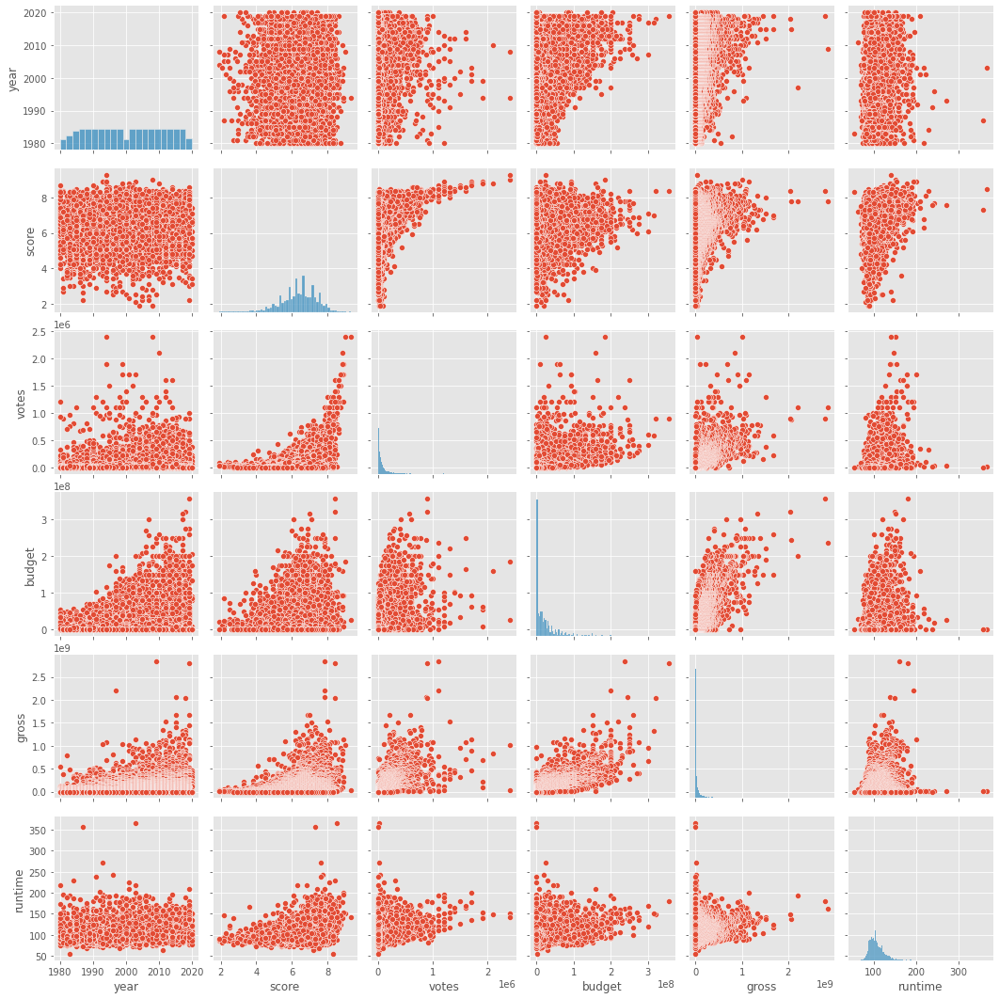

In [90]:
sns.pairplot(data)

In [149]:
numerical_data=data
for col_name in numerical_data:
    if(numerical_data[col_name].dtype=='object'):
        numerical_data[col_name]=numerical_data[col_name].astype('category')
        numerical_data[col_name]=numerical_data[col_name].cat.codes

numerical_data  .head()    

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,year-correct
5445,533,5,0,2009,697,7.8,1100000.0,1155,1778,2334,55,237000000,2847246203,2253,162.0,31
7445,535,5,0,2019,184,8.4,903000.0,162,743,2241,55,356000000,2797501328,1606,181.0,41
3045,6896,5,6,1997,705,7.8,1100000.0,1155,1778,1595,55,200000000,2201647264,2253,194.0,19
6663,5144,5,0,2015,699,7.8,876000.0,1125,2550,524,55,245000000,2069521700,1540,138.0,37
7244,536,5,0,2018,193,8.4,897000.0,162,743,2241,55,321000000,2048359754,1606,149.0,40


In [100]:
new_correlation=numerical_data.corr()

In [116]:
new_correlation

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,year-correct
name,1.000000,-0.008069,0.016355,0.011453,-0.011311,0.017097,0.013088,0.009079,0.009081,0.006472,-0.010737,0.020548,0.006989,0.009211,0.010392,0.010071
rating,-0.008069,1.000000,0.072423,0.008779,0.016613,-0.001314,0.033225,0.019483,-0.005921,0.013405,0.081244,-0.081939,-0.095450,-0.032943,0.062145,0.008230
genre,0.016355,0.072423,1.000000,-0.081261,0.029822,0.027965,-0.145307,-0.015258,0.006567,-0.005477,-0.037615,-0.334021,-0.234297,-0.071067,-0.052711,-0.078972
year,0.011453,0.008779,-0.081261,1.000000,-0.000695,0.097995,0.222945,-0.020795,-0.008656,-0.027242,-0.070938,0.309212,0.261900,-0.010431,0.120811,0.990063
released,-0.011311,0.016613,0.029822,-0.000695,1.000000,0.042788,0.016097,-0.001478,-0.002404,0.015777,-0.020427,0.009145,0.000519,-0.010474,0.000868,-0.006411
score,0.017097,-0.001314,0.027965,0.097995,0.042788,1.000000,0.409182,0.009559,0.019416,-0.001609,-0.133348,0.055665,0.186392,0.001030,0.399451,0.103330
votes,0.013088,0.033225,-0.145307,0.222945,0.016097,0.409182,1.000000,0.000260,0.000892,-0.019282,0.073625,0.486862,0.632834,0.133204,0.309212,0.218468
director,0.009079,0.019483,-0.015258,-0.020795,-0.001478,0.009559,0.000260,1.000000,0.299067,0.039234,0.017490,0.004976,-0.014916,0.004404,0.017624,-0.019692
writer,0.009081,-0.005921,0.006567,-0.008656,-0.002404,0.019416,0.000892,0.299067,1.000000,0.027245,0.015343,-0.025911,-0.022997,0.005646,-0.003511,-0.007400
star,0.006472,0.013405,-0.005477,-0.027242,0.015777,-0.001609,-0.019282,0.039234,0.027245,1.000000,-0.012998,-0.019952,-0.001129,0.012442,0.010174,-0.025231


In [115]:
cor_pair=new_correlation.unstack()
cor_pair

name          name            1.000000
              rating         -0.008069
              genre           0.016355
              year            0.011453
              released       -0.011311
              score           0.017097
              votes           0.013088
              director        0.009079
              writer          0.009081
              star            0.006472
              country        -0.010737
              budget          0.020548
              gross           0.006989
              company         0.009211
              runtime         0.010392
              year-correct    0.010071
rating        name           -0.008069
              rating          1.000000
              genre           0.072423
              year            0.008779
              released        0.016613
              score          -0.001314
              votes           0.033225
              director        0.019483
              writer         -0.005921
              star       

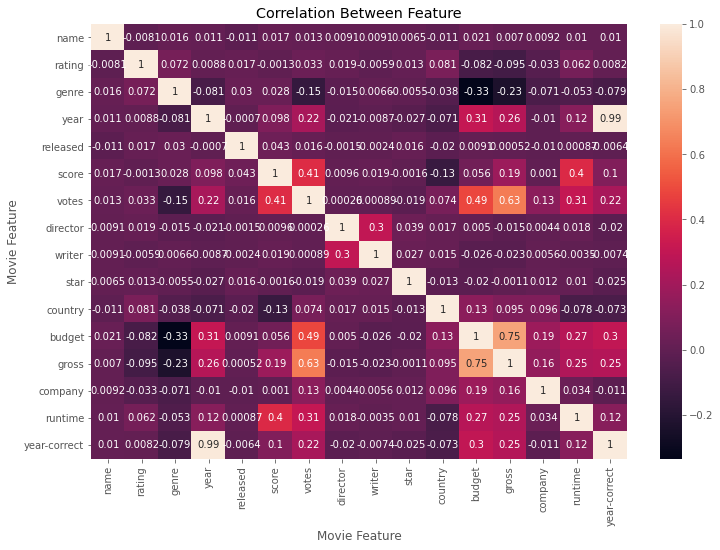

In [107]:
#correlation After Convert object columns to numerical values
sns.heatmap(new_correlation,annot=True)
plt.title("Correlation Between Feature")
plt.xlabel("Movie Feature")
plt.ylabel("Movie Feature")
plt.show()

In [119]:
#show sorted correlation between objects
sorted_pairs=cor_pair.sort_values(ascending=False)
sorted_pairs

name          name            1.000000
rating        rating          1.000000
runtime       runtime         1.000000
company       company         1.000000
gross         gross           1.000000
budget        budget          1.000000
country       country         1.000000
star          star            1.000000
writer        writer          1.000000
director      director        1.000000
votes         votes           1.000000
score         score           1.000000
released      released        1.000000
year          year            1.000000
genre         genre           1.000000
year-correct  year-correct    1.000000
              year            0.990063
year          year-correct    0.990063
gross         budget          0.750157
budget        gross           0.750157
votes         gross           0.632834
gross         votes           0.632834
votes         budget          0.486862
budget        votes           0.486862
score         votes           0.409182
votes         score      

In [128]:
high_correlation=sorted_pairs[sorted_pairs>0.6]
high_correlation

name          name            1.000000
rating        rating          1.000000
runtime       runtime         1.000000
company       company         1.000000
gross         gross           1.000000
budget        budget          1.000000
country       country         1.000000
star          star            1.000000
writer        writer          1.000000
director      director        1.000000
votes         votes           1.000000
score         score           1.000000
released      released        1.000000
year          year            1.000000
genre         genre           1.000000
year-correct  year-correct    1.000000
              year            0.990063
year          year-correct    0.990063
gross         budget          0.750157
budget        gross           0.750157
votes         gross           0.632834
gross         votes           0.632834
dtype: float64

In [129]:
#votes And Budgwt Have A Highe Correlation To increase Girss Earnings
#company has low correlation

<AxesSubplot:>

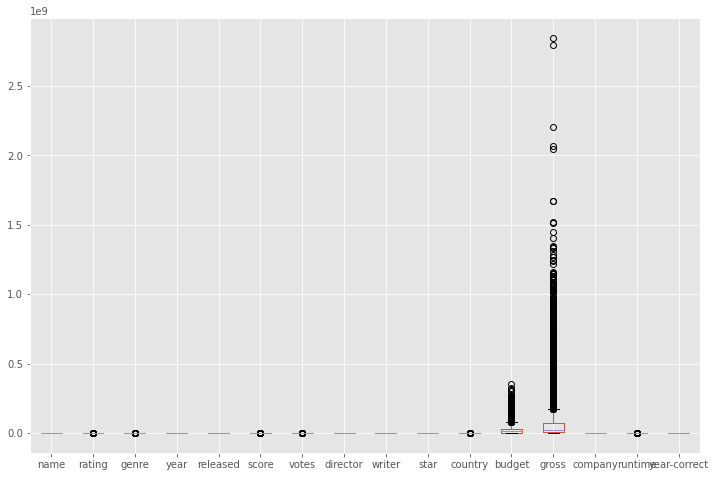

In [138]:
#show Box plot of Data 
# there is an problem beacuse there is small value and Larger value so the figure didn't interprt anything so
# we should convert All values Between 0 and 1
numerical_data.plot(kind="box")

In [150]:
data.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,year-correct
5445,533,5,0,2009,697,7.8,1100000.0,1155,1778,2334,55,237000000,2847246203,2253,162.0,31
7445,535,5,0,2019,184,8.4,903000.0,162,743,2241,55,356000000,2797501328,1606,181.0,41
3045,6896,5,6,1997,705,7.8,1100000.0,1155,1778,1595,55,200000000,2201647264,2253,194.0,19
6663,5144,5,0,2015,699,7.8,876000.0,1125,2550,524,55,245000000,2069521700,1540,138.0,37
7244,536,5,0,2018,193,8.4,897000.0,162,743,2241,55,321000000,2048359754,1606,149.0,40


In [140]:
test_data=numerical_data

In [145]:
# convert All Values Between ) and 1 using sklearn libariy 

from sklearn import preprocessing
x = test_data.values #returns a numpy array
min_max_scaler = preprocessing.MinMaxScaler()
x_scaled = min_max_scaler.fit_transform(x)
test_data = pd.DataFrame(x_scaled,columns=data.columns)




<AxesSubplot:>

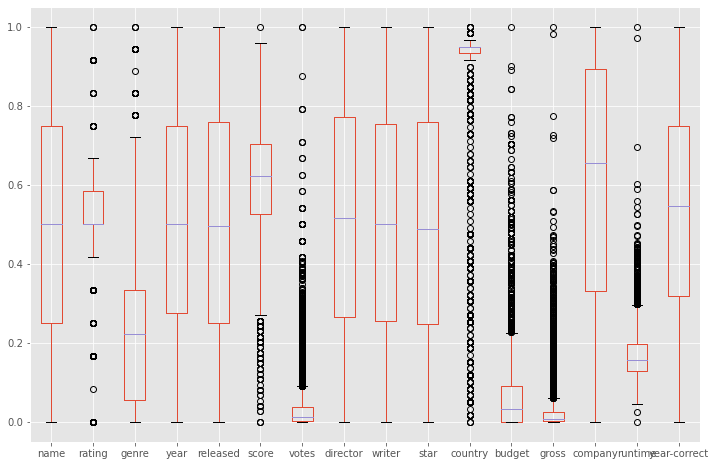

In [146]:
#Box plot Diagram
test_data.plot(kind="box")

<AxesSubplot:ylabel='Density'>

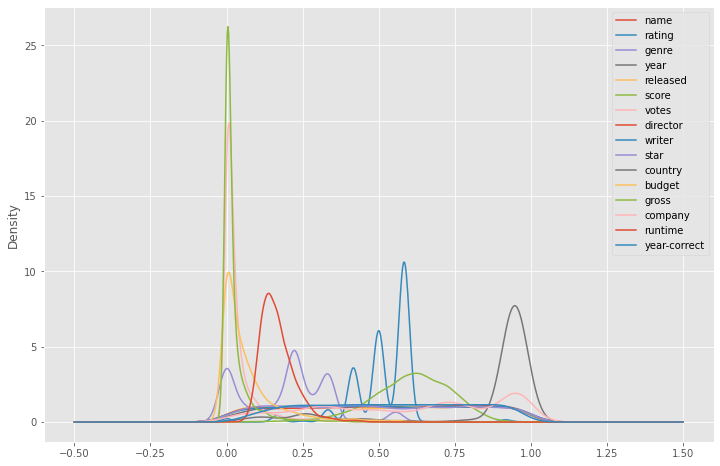

In [151]:
#density plot Diagram
test_data.plot(kind="density")